In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# importazione delle librerie e dei pacchetti usati nei vari moduli

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
import random
import platform
import gc
import torchvision.transforms as transforms

from PIL import Image, ImageOps
from torch import nn, optim
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torch.amp import autocast, GradScaler
from torchvision.transforms import InterpolationMode, functional as TF
from tqdm import tqdm
from skimage.morphology import remove_small_objects

# !pip install tensorflow --upgrade
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet import preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam

In [ ]:
# Controllo gpu.

print('Torch:', torch.__version__)
print('CUDA :', torch.version.cuda)
print('cuDNN:', torch.backends.cudnn.version())
print('GPU  :', torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'CPU only')

device = 'cuda' if torch.cuda.is_available() else 'cpu'

gc.collect()              # Forza garbage-collection.
torch.cuda.empty_cache()  # Libera la cache di PyTorch.

# Facoltativo: stampa lo stato della GPU.
if torch.cuda.is_available():
  !nvidia-smi | head -n 20

Torch: 2.6.0+cu124
CUDA : 12.4
cuDNN: 90300
GPU  : Tesla T4
Fri Jul 18 06:03:07 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   58C    P8             12W /   70W |       2MiB /  15360MiB |      0%      Default |
|                                         |                        |            

**1. Caricamento dataset, import necessari**

In [ ]:
base_dir = "/content/drive/MyDrive/proj_cv/"

img_rectification_input_folder = base_dir + "img_rectification/"
img_rectification_output_folder = img_rectification_input_folder + "output_results"

dataset_path = os.path.join(base_dir, "dataset", "paired_dataset_art")
damaged_path = os.path.join(dataset_path, "damaged")
undamaged_path = os.path.join(damaged_path, "undamaged")
processed_path = os.path.join(base_dir, "processed_images")

# --- Per U-Net: cartelle sorgenti (alta risoluzione) ---
img_unet_input_folder = "danielaivanova/damage_analogue/"
img_unet_input_images_folder = base_dir + img_unet_input_folder + "image"
img_unet_input_masks_folder = base_dir + img_unet_input_folder + "annotation_bw"  # Maschere binarie.

# --- Per U-Net: cartelle di destinazione (1024 × 1 024) ---
img_unet_output_images_folder = base_dir + img_unet_input_folder + "image_1k"
img_unet_output_masks_folder = base_dir + img_unet_input_folder + "mask_1k"

unet_weights_path = base_dir + "unet_best.pt"
resnet_weights_path = base_dir + 'resnet50_finetuned_weights.weights.h5'

img_input_crack_folder = base_dir + "corrected_dataset/crack/"
img_input_noncrack_folder = base_dir + "corrected_dataset/noncrack/"

**2. Image rectification (geometria)**

In [ ]:
# --- Funzioni di utilità ---

def compute_intersection(line1, line2):
    x1, y1, x2, y2 = line1
    x3, y3, x4, y4 = line2

    A = np.array([
        [x2 - x1, x3 - x4],
        [y2 - y1, y3 - y4]
    ])

    b = np.array([x3 - x1, y3 - y1])

    if np.linalg.det(A) == 0:
        return None  # Linee parallele

    t, s = np.linalg.solve(A, b)

    x = x1 + t * (x2 - x1)
    y = y1 + t * (y2 - y1)

    return (x, y)

def clamp_point_to_image(pt, img_shape):
    x, y = pt
    h, w = img_shape[:2]

    x_clamped = max(0, min(w - 1, int(x)))
    y_clamped = max(0, min(h - 1, int(y)))

    return (x_clamped, y_clamped)

def draw_vp_line(img, start_pt, vp, color, length=2000):
    vx, vy = vp[0] - start_pt[0], vp[1] - start_pt[1]

    norm = np.sqrt(vx ** 2 + vy ** 2)

    if norm == 0:
        return

    vx, vy = vx / norm, vy / norm

    end_pt = (int(start_pt[0] + vx * length), int(start_pt[1] + vy * length))

    cv2.line(img, tuple(start_pt), end_pt, color, 2)

def build_homography_send_vp_to_infinity(vp, img_shape):
    x, y = vp
    h, w = img_shape[:2]
    cx, cy = w / 2, h / 2

    vx = x - cx
    vy = y - cy

    norm = np.sqrt(vx ** 2 + vy ** 2)

    if norm < 1e-6:
        print("VP troppo vicino al centro. Nessuna trasformazione.")

        return np.eye(3), (w, h)

    dx = vx / norm
    dy = vy / norm

    scale = norm * 1.0

    T1 = np.array([
        [1, 0, -cx],
        [0, 1, -cy],
        [0, 0, 1]
    ])

    T2 = np.array([
        [1, 0, cx],
        [0, 1, cy],
        [0, 0, 1]
    ])

    H_vp = np.eye(3)
    H_vp[2, 0] = -dx / scale
    H_vp[2, 1] = -dy / scale

    H = T2 @ H_vp @ T1

    corners = np.array([
        [0, 0],
        [w - 1, 0],
        [w - 1, h - 1],
        [0, h - 1]
    ], dtype=np.float32)

    corners_h = np.vstack([corners.T, np.ones((1, 4))])
    warped_corners_h = H @ corners_h
    warped_corners = (warped_corners_h[:2] / warped_corners_h[2]).T

    min_x, min_y = warped_corners.min(axis=0)
    max_x, max_y = warped_corners.max(axis=0)

    tx = -min_x if min_x < 0 else 0
    ty = -min_y if min_y < 0 else 0

    T_shift = np.array([
        [1, 0, tx],
        [0, 1, ty],
        [0, 0, 1]
    ])

    H_final = T_shift @ H
    out_w = int(np.ceil(max_x + tx))
    out_h = int(np.ceil(max_y + ty))

    return H_final, (out_w, out_h)


# --- Carica immagine ---

def manage_image(input_path):
  image = cv2.imread(input_path)

  if image is None:
    raise RuntimeError("Immagine non trovata.")

  # --- Preprocessing ---
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  gray = cv2.bilateralFilter(gray, 11, 17, 17)

  edges = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 11, 3)

  kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
  edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

  contours, _ = cv2.findContours(edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

  approx_polygon = None

  for cnt in sorted(contours, key=cv2.contourArea, reverse=True)[:10]:
    epsilon = 0.02 * cv2.arcLength(cnt, True)
    approx = cv2.approxPolyDP(cnt, epsilon, True)

    if 4 <= len(approx) <= 6 and cv2.contourArea(approx) > 10000 and cv2.isContourConvex(approx):
        approx_polygon = approx
        break

  if approx_polygon is None:
    raise RuntimeError("Nessun bordo quadro rilevato.")

  painting_polygon = approx_polygon.reshape(-1, 2)

  # --- Calcolo edges e vanishing points ---
  edges = [(*painting_polygon[i], *painting_polygon[(i + 1) % len(painting_polygon)]) for i in range(len(painting_polygon))]

  vp1 = compute_intersection(edges[0], edges[2])
  vp2 = compute_intersection(edges[1], edges[3])

  # print(f"Vanishing Point 1: {vp1}")
  # print(f"Vanishing Point 2: {vp2}")

  # --- Visualizza contorno + intersezioni ---
  image_debug = image.copy()

  for i in range(len(painting_polygon)):
    pt1 = tuple(painting_polygon[i])
    pt2 = tuple(painting_polygon[(i + 1) % len(painting_polygon)])
    cv2.line(image_debug, pt1, pt2, (0, 255, 0), 2)

  intersections = []
  for i in range(len(edges)):
    for j in range(i + 1, len(edges)):
        pt = compute_intersection(edges[i], edges[j])
        if pt:
            intersections.append(pt)
            cv2.circle(image_debug, (int(pt[0]), int(pt[1])), 6, (0, 0, 255), -1)

  plt.figure(figsize=(10, 8))
  plt.imshow(cv2.cvtColor(image_debug, cv2.COLOR_BGR2RGB))
  plt.title("Bordi dei poligoni ed intersezioni.")
  plt.axis('off')
  plt.show()

  return [image, painting_polygon];

In [ ]:
# --- Rettifica usando i 4 vertici del quadro ---

# Ordina i punti del poligono se necessario.
# Assicurati che siano sempre nello stesso ordine: top-left, top-right, bottom-right, bottom-left
def order_points(pts):
    rect = np.zeros((4, 2), dtype="float32")

    s = pts.sum(axis=1)

    rect[0] = pts[np.argmin(s)]  # top-left
    rect[2] = pts[np.argmax(s)]  # bottom-right

    diff = np.diff(pts, axis=1)
    rect[1] = pts[np.argmin(diff)]  # top-right
    rect[3] = pts[np.argmax(diff)]  # bottom-left

    return rect

def rectify_image(image, painting_polygon, output_path, image_name):
  # Ordina i punti rilevati.
  src_pts = order_points(painting_polygon)

  # Calcola larghezza e altezza dell'immagine rettificata.
  width_top = np.linalg.norm(src_pts[0] - src_pts[1])
  width_bottom = np.linalg.norm(src_pts[2] - src_pts[3])
  maxWidth = int(max(width_top, width_bottom))

  height_left = np.linalg.norm(src_pts[0] - src_pts[3])
  height_right = np.linalg.norm(src_pts[1] - src_pts[2])
  maxHeight = int(max(height_left, height_right))

  # Crea rettangolo "ideale".
  dst_pts = np.array([
    [0, 0],
    [maxWidth - 1, 0],
    [maxWidth - 1, maxHeight - 1],
    [0, maxHeight - 1]
  ], dtype="float32")

  # Calcola omografia e rettifica.
  H = cv2.getPerspectiveTransform(src_pts, dst_pts)
  rectified = cv2.warpPerspective(image, H, (maxWidth, maxHeight))

  # Visualizza e salva.
  plt.figure(figsize=(10, 8))
  plt.imshow(cv2.cvtColor(rectified, cv2.COLOR_BGR2RGB))
  plt.title("Quadro rettificato frontalmente.")
  plt.axis('off')
  plt.show()

  # cv2.imwrite("quadro_rettificato.jpg", rectified)
  filename = os.path.join(img_rectification_output_folder, "rectified_" + image_name)
  cv2.imwrite(filename, rectified)

  print("Quadro rettificato salvato come " + "rectified_" + image_name + ".")


In [ ]:
def set_rectification_pipeline(image_name):
  result = manage_image(img_rectification_input_folder + image_name)

  image = result[0]
  painting_polygon = result[1]

  rectify_image(image, painting_polygon, img_rectification_output_folder, image_name)

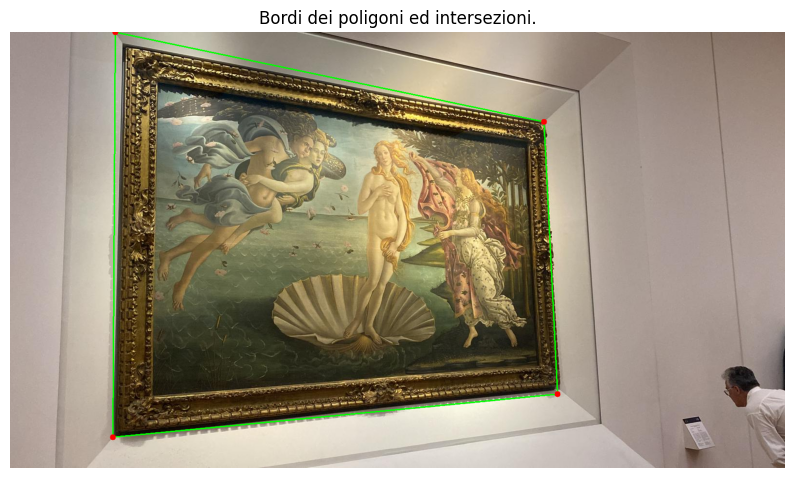

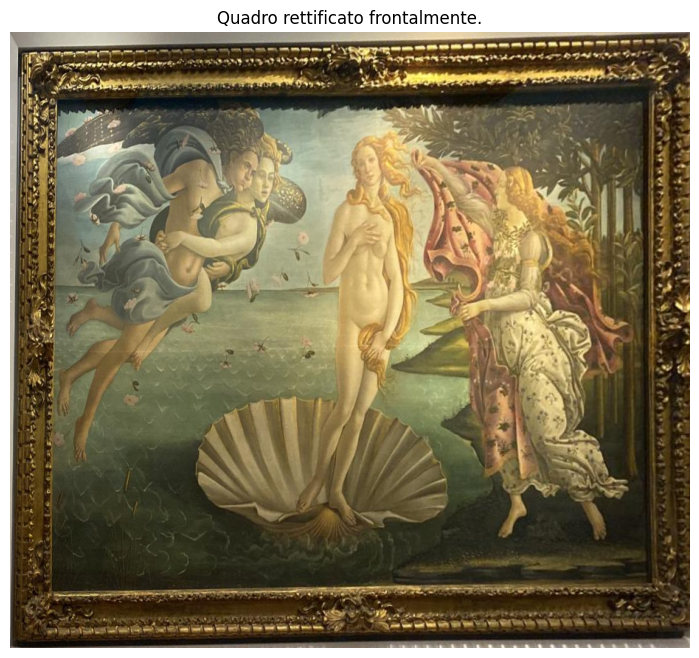

Quadro rettificato salvato come rectified_IMG_1000.jpg.


In [ ]:
set_rectification_pipeline("IMG_1000.jpg")


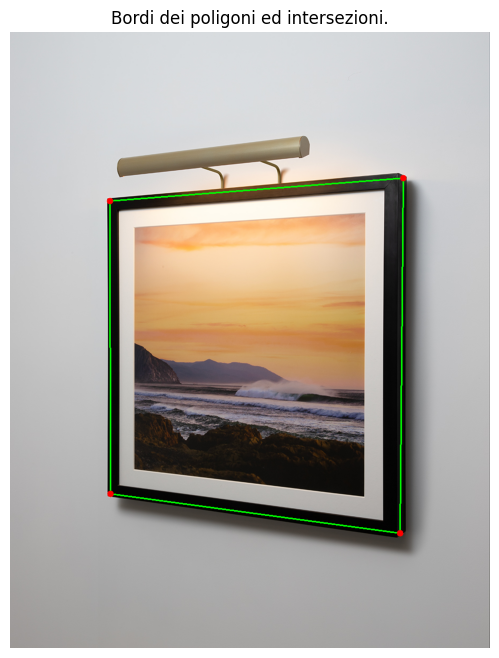

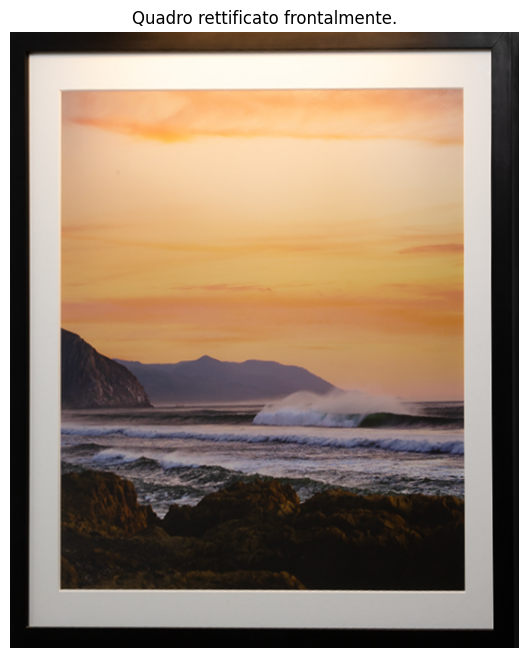

Quadro rettificato salvato come rectified_painting_distorted.jpg.


In [ ]:
set_rectification_pipeline("painting_distorted.jpg")

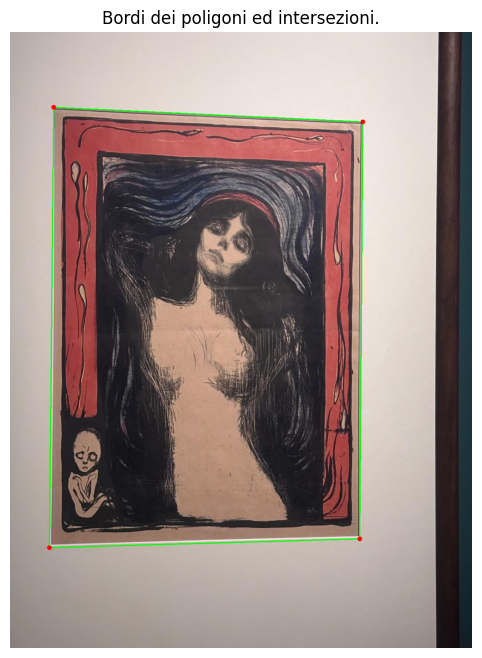

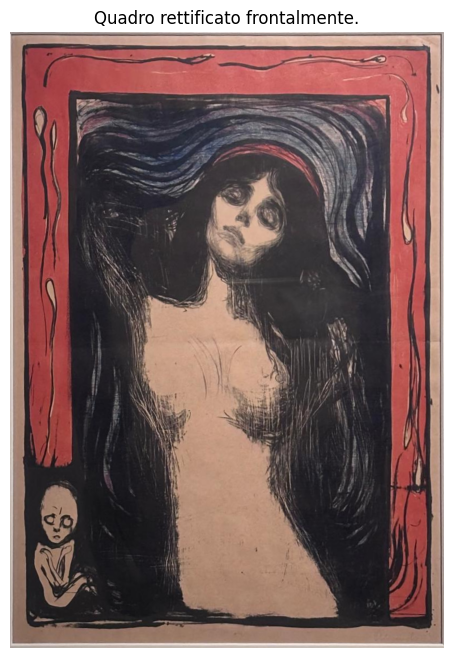

Quadro rettificato salvato come rectified_img_07.jpeg.


In [ ]:
set_rectification_pipeline("img_07.jpeg")

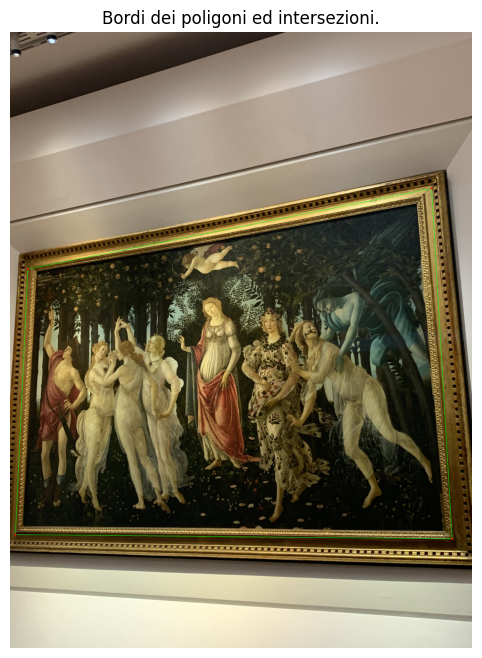

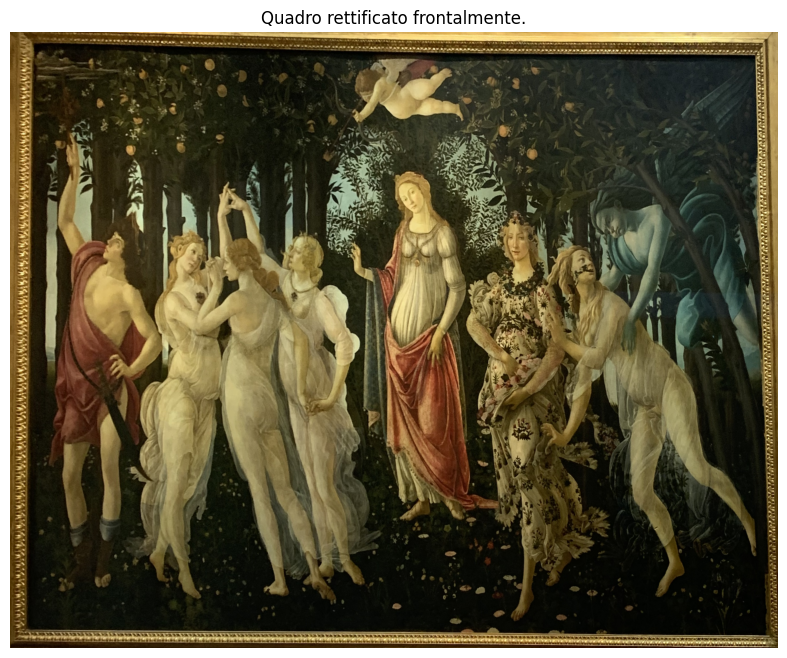

Quadro rettificato salvato come rectified_img_17.jpg.


In [ ]:
set_rectification_pipeline("img_17.jpg")

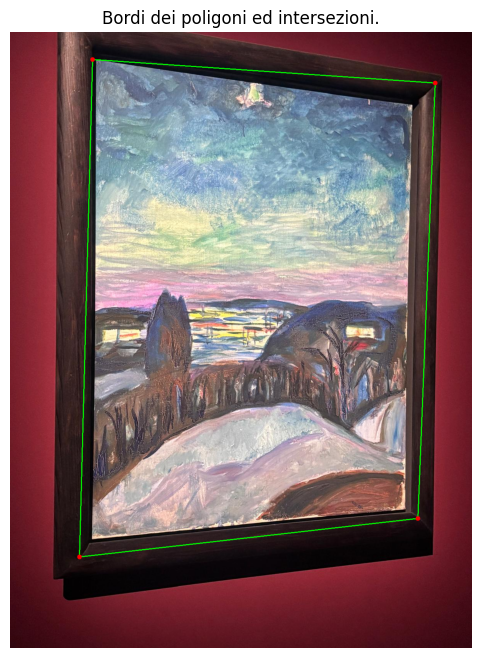

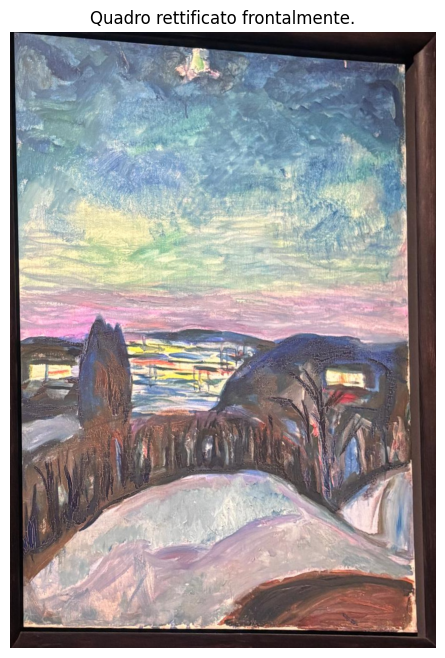

Quadro rettificato salvato come rectified_img_08.jpeg.


In [ ]:
set_rectification_pipeline("img_08.jpeg")

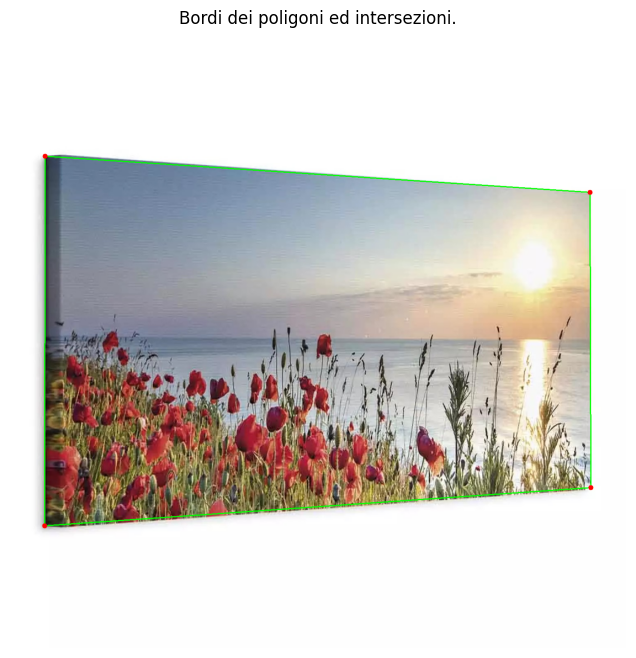

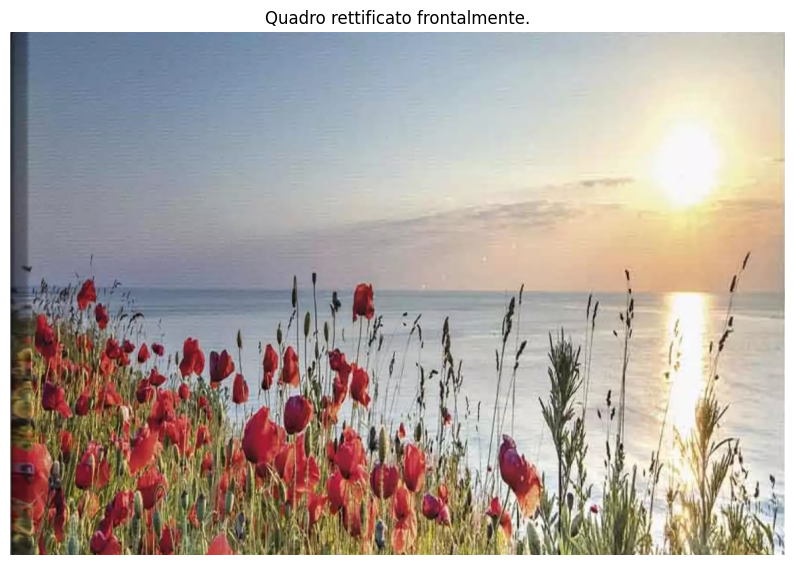

Quadro rettificato salvato come rectified_97607aa622f1a922434cb151a8337c55.jpeg.


In [ ]:
set_rectification_pipeline("97607aa622f1a922434cb151a8337c55.jpeg")

**3. Pipeline manuale ricerca crack (applicazione filtri)**

In [ ]:
# Funzione per la rimozione del noise (white noise) con un filtro gaussiano.

def preprocess_image(img, denoise=True):
    img_size = (256, 256)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, img_size)

    if denoise:
        img = cv2.GaussianBlur(img, (5,5), 0)

    img = cv2.normalize(img.astype(np.float32), None, 0, 255, cv2.NORM_MINMAX)
    img = img.astype(np.uint8)

    return img

# Funzione per l'applicazione del contrast-stretching.

def apply_contrast_stretching(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    min_val, max_val = np.min(gray), np.max(gray)
    d = max_val - min_val

    if(d == 0):
        d = 0.0001;

    stretched = ((gray - min_val) / d * 255).astype(np.uint8)
    stretched = cv2.cvtColor(stretched, cv2.COLOR_GRAY2RGB)

    return stretched

# Funzione per l'applicazione dell'algoritmo di Otsu.

def apply_otsu(img):
  img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  global_thr = 127

  # Global thresholding.
  ret1, th1 = cv2.threshold(img, global_thr, 255, cv2.THRESH_BINARY)

  # Otsu's thresholding.
  ret2, th2 = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

  # Visualizza le immagini e relativi istogrammi.
  images = [img, 0, th1, th2]

  titles = ['Immagine preprocessata.', 'Istogramma', 'Global Thresholding (v=' + str(global_thr) + ').', "Otsu's Thresholding."]

  fig, axs = plt.subplots(1, 4, figsize=(16, 4))

  # Immagine originale già preprocessata (es.: già applicato il filtro gaussiano per il denoising).
  axs[0].imshow(img, cmap='gray')
  axs[0].set_title(titles[0])
  axs[0].axis('off')

  # Istogramma.
  axs[1].hist(img.ravel(), 256)
  axs[1].set_title(titles[1])

  # Global threshold.
  axs[2].imshow(th1, cmap='gray')
  axs[2].set_title(titles[2])
  axs[2].axis('off')

  # Otsu threshold.
  axs[3].imshow(th2, cmap='gray')
  axs[3].set_title(titles[3])
  axs[3].axis('off')

  plt.tight_layout()
  plt.show()

  return img

# Funzione per l'applicazione del thresholding adattivo.

def apply_adaptive(img):
  img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  global_thr = 127

  # img = cv2.medianBlur(img, 5)

  # Global thresholding.
  ret, th1 = cv2.threshold(img, global_thr, 255, cv2.THRESH_BINARY)

  # Adaptive thresholding.
  th2 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
  th3 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

  images = [img, th1, th2, th3]

  titles = ['Immagine preprocessata.', 'Global Thresholding (v=' + str(global_thr) + ').', 'Adaptive Mean Thresholding.', 'Adaptive Gaussian Thresholding.']

  fig, axs = plt.subplots(1, 4, figsize=(16, 4))

  # Immagine originale già preprocessata (es.: già applicato il filtro gaussiano per il denoising).
  axs[0].imshow(img, cmap='gray')
  axs[0].set_title(titles[0])
  axs[0].axis('off')

  # Global threshold.
  axs[1].imshow(th1, cmap='gray')
  axs[1].set_title(titles[1])
  axs[1].axis('off')

  # Adaptive Mean Thresholding.
  axs[2].imshow(th1, cmap='gray')
  axs[2].set_title(titles[2])
  axs[2].axis('off')

  # Adaptive Gaussian Thresholding.
  axs[3].imshow(th2, cmap='gray')
  axs[3].set_title(titles[3])
  axs[3].axis('off')

  plt.tight_layout()
  plt.show()

  return img;

# Funzione per la definizione della pipeline.

def set_pipeline(path, isOtsu=False, isAdaptive=False):
    img = cv2.imread(path)
    # print(img.shape)

    img = preprocess_image(img)
    # print(img.shape)

    img = apply_contrast_stretching(img)
    # print(img.shape)

    if isOtsu:
      img = apply_otsu(img)
      # print(img.shape)

    if isAdaptive:
      img = apply_adaptive(img)
      # print(img.shape)

    # img = apply_morphology(img)

    return img

# Funzione per l'applicazione della pipeline.

def apply_pipeline(damaged_path_p, undamaged_path_p, isOtsu=False, isAdaptive=False):
  counter = 1
  n = 6

  for img_name in os.listdir(damaged_path_p):
      damaged_path = os.path.join(damaged_path_p, img_name)
      undamaged_name = img_name.replace("-before", "-after")
      undamaged_path = os.path.join(undamaged_path_p, undamaged_name)

      img = set_pipeline(damaged_path, isOtsu, isAdaptive)

      counter = counter + 1

      if counter == n :
        break;

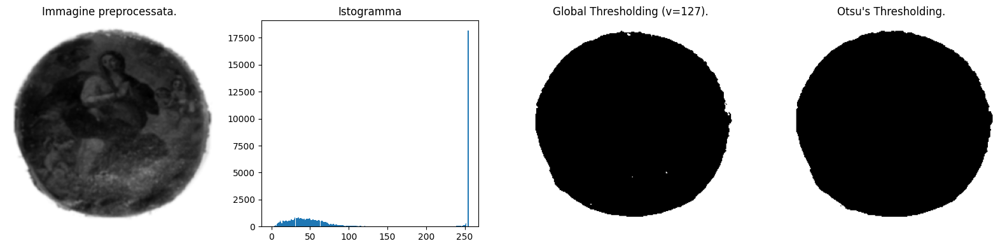

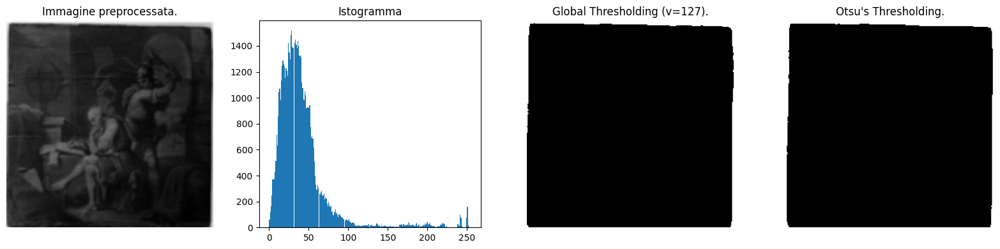

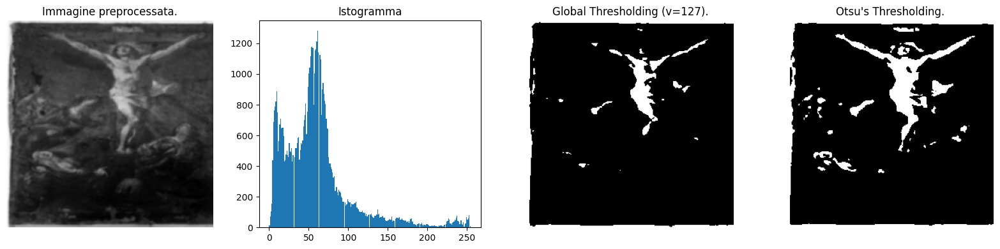

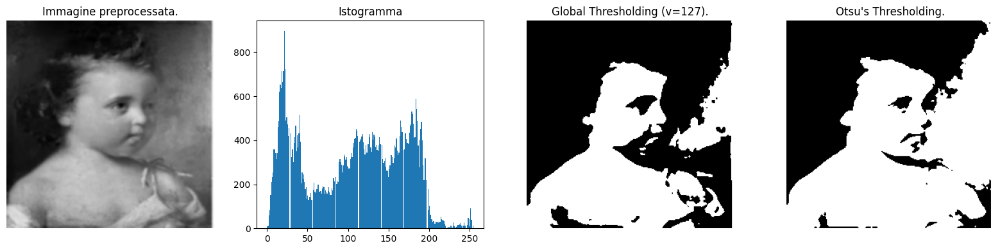

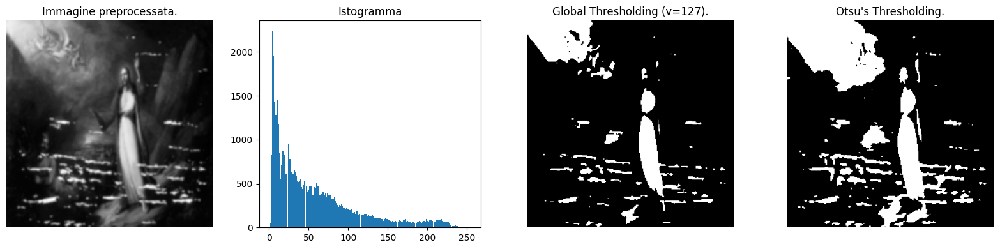

In [ ]:
# Applicazione pipeline con Otsu.

apply_pipeline(damaged_path, undamaged_path, True, False)

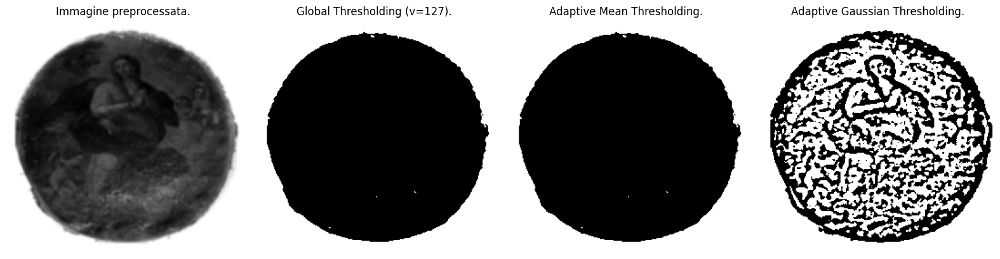

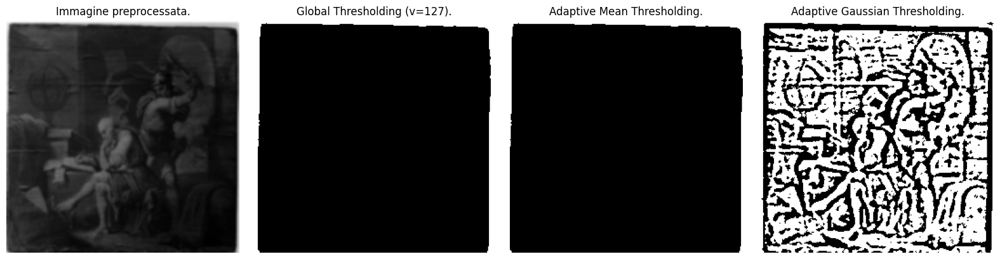

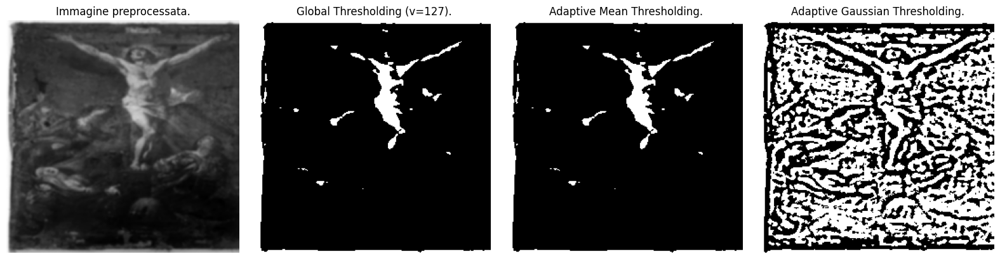

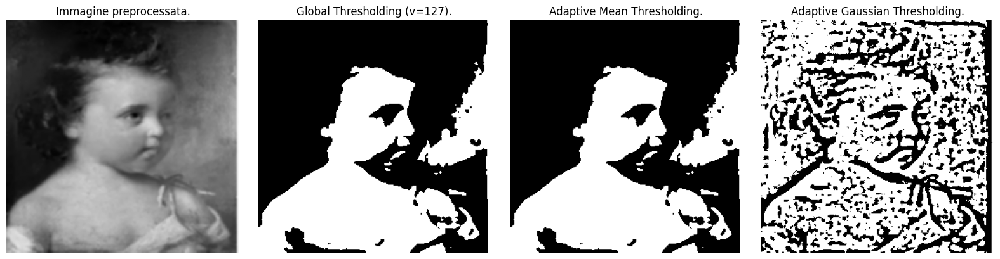

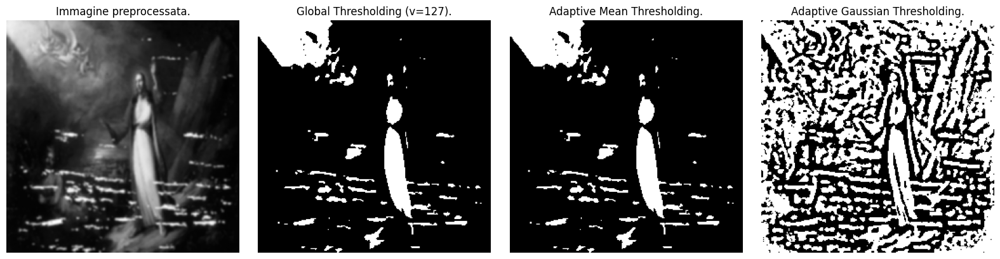

In [ ]:
# Applicazione pipeline con Adaptive.

apply_pipeline(damaged_path, undamaged_path, False, True)

**4. ResNet (classificazione)**

In [ ]:
# Caricamento dati
def load_dataset(image_dir, label):
    data, labels = [], []

    for file in os.listdir(image_dir):
        if file.lower().endswith(('.jpg', '.jpeg', '.png')):
            try:
                img = load_img(os.path.join(image_dir, file), target_size=(224, 224))
                data.append(img_to_array(img))
                labels.append(label)
            except:
                continue

    return data, labels

crack_images, crack_labels = load_dataset(img_input_crack_folder, 1)
noncrack_images, noncrack_labels = load_dataset(img_input_noncrack_folder, 0)

all_images = np.array(crack_images + noncrack_images)
all_labels = np.array(crack_labels + noncrack_labels)

# Split.
X_temp, X_test, y_temp, y_test = train_test_split(all_images, all_labels, test_size=0.15, stratify=all_labels, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.1765, stratify=y_temp, random_state=42)

# Preprocessing.
train_gen = ImageDataGenerator(preprocessing_function=preprocess_input)
val_test_gen = ImageDataGenerator(preprocessing_function=preprocess_input)

train_generator = train_gen.flow(X_train, y_train, batch_size=32, shuffle=True)
val_generator = val_test_gen.flow(X_val, y_val, batch_size=32, shuffle=False)
test_generator = val_test_gen.flow(X_test, y_test, batch_size=32, shuffle=False)

# Modello base + top.
base_model = ResNet50(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
base_model.trainable = False

x = GlobalAveragePooling2D()(base_model.output)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)

output = Dense(1, activation='sigmoid')(x)

modelRN = Model(inputs=base_model.input, outputs=output)
modelRN.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

# Class weights.
class_weights = dict(enumerate(compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)))

if os.path.exists(resnet_weights_path):
    modelRN.load_weights(resnet_weights_path)

    print("Caricati i pesi da disco.")
else:
  # Training fase 1 -> risultati del training nella prima fase.
  history1 = modelRN.fit(
    train_generator,
    epochs=10,
    validation_data=val_generator,
    class_weight=class_weights,
    callbacks=[EarlyStopping(patience=3, restore_best_weights=True)]
  )

  # Fine-tuning ultimi layer.
  for layer in base_model.layers[-10:]:
    layer.trainable = True

  modelRN.compile(optimizer=Adam(learning_rate=1e-5), loss='binary_crossentropy', metrics=['accuracy'])

  # Risultati del fine-tuning.
  history2 = modelRN.fit(
    train_generator,
    epochs=20,
    validation_data=val_generator,
    class_weight=class_weights,
    callbacks=[
        EarlyStopping(patience=5, restore_best_weights=True),
        ReduceLROnPlateau(factor=0.1, patience=2)
    ]
  )

  # Save weights after training
  modelRN.save_weights(resnet_weights_path)

# Valutazione finale
loss, accuracy = modelRN.evaluate(test_generator)

print(f'Test Accuracy after fine-tuning: {accuracy:.2f}.')

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 34 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Caricati i pesi da disco.
2/2 ━━━━━━━━━━━━━━━━━━━━ 11s 3s/step - accuracy: 0.6863 - loss: 0.6454
Test Accuracy after fine-tuning: 0.69.


In [ ]:
def show_image(test_path):
  img = load_img(test_path, target_size=(224, 224))
  img_array = img_to_array(img)
  img_array = preprocess_input(img_array)
  img_array = np.expand_dims(img_array, axis=0)

  # Predizione.
  prediction = modelRN.predict(img_array)
  label = "Crack" if prediction[0][0] > 0.5 else "Non-Crack"

  # Mostra immagine con predizione.
  plt.imshow(img)
  plt.title(f"Predicted: {label} ({prediction[0][0]:.4f}).")
  plt.axis('off')
  plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


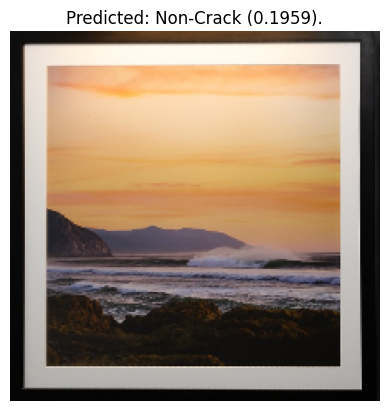

In [ ]:
show_image(img_rectification_output_folder + "/rectified_painting_distorted.jpg")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


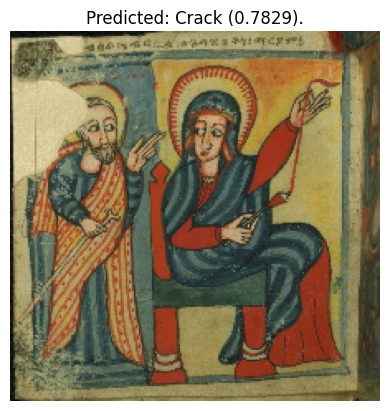

In [ ]:
show_image(img_unet_input_images_folder + "/cljmrkz5n341f07clcujw105j.png")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


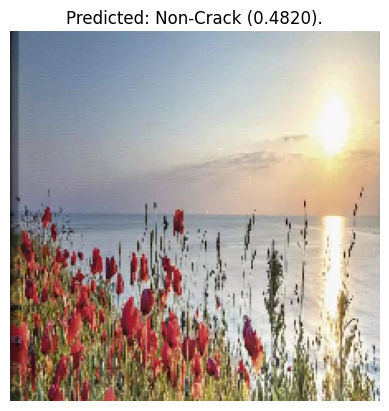

In [ ]:
show_image(img_rectification_output_folder + "/rectified_97607aa622f1a922434cb151a8337c55.jpeg")

**5. U-Net (segmentazione)**

In [ ]:
seed = 42

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
os.environ["PYTHONHASHSEED"] = str(seed)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
torch.use_deterministic_algorithms(True)

# Solo se serve determinismo più profondo (Ampere+).
os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":16:8"

In [ ]:
# Riduzione immagini a 1024 px (eseguire una sola volta).

max_side  = 1024
supported = ('.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff')

for fname in tqdm(os.listdir(img_unet_input_images_folder)):
    if not fname.lower().endswith(supported):
        continue

    # ---------- IMMAGINE RGB ----------
    img_dst = os.path.join(img_unet_output_images_folder, fname)

    if not os.path.exists(img_dst):
        img = Image.open(os.path.join(img_unet_input_images_folder, fname)).convert("RGB")
        img = ImageOps.pad(img, (max_side, max_side), method=Image.LANCZOS, color=0, centering=(0.5,0.5))
        img.save(img_dst)

    # ---------- MASCHERA BINARIA ----------
    msk_dst = os.path.join(img_unet_output_masks_folder, fname)

    if not os.path.exists(msk_dst):
        msk = Image.open(os.path.join(img_unet_input_masks_folder, fname)).convert("1")  # Bianco/nero.
        msk = ImageOps.pad(msk, (max_side, max_side), method=Image.NEAREST, color=0, centering=(0.5,0.5))
        msk.save(msk_dst)

print("✅ Immagini e maschere ridotte & quadrate a 1024 × 1024 px.")

100%|██████████| 418/418 [00:00<00:00, 1428.13it/s]

✅ Immagini e maschere ridotte & quadrate a 1024 × 1024 px.


In [ ]:
# Transform e Dataset.

img_tfms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]),
])
mask_tfms = transforms.ToTensor()   # PNG '1' → {0,1}

class CrackDataset(Dataset):
    def __init__(self, img_dir, mask_dir):
        self.img_dir, self.mask_dir = img_dir, mask_dir
        self.files = sorted(set(f for f in os.listdir(img_dir) if f.endswith('.png'))
                            & set(f for f in os.listdir(mask_dir) if f.endswith('.png')))

    def __len__(self):
      return len(self.files)

    def __getitem__(self, idx):
      f = self.files[idx]
      img = Image.open(os.path.join(self.img_dir, f)).convert('RGB')
      msk = Image.open(os.path.join(self.mask_dir, f)).convert('1')

      img_tensor = img_tfms(img)
      msk_tensor = mask_tfms(msk)

      # Crea una "mask di validità": 1 dove la maschera è valida, 0 nei bordi neri.
      valid_mask = (msk_tensor != 0).float()

      return img_tensor, msk_tensor, valid_mask

In [ ]:
# Modello U-Net.

class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super().__init__()

        def blk(i, o): return nn.Sequential(
            nn.Conv2d(i, o, 3, 1, 1), nn.ReLU(inplace=True),
            nn.Conv2d(o, o, 3, 1, 1), nn.ReLU(inplace=True))

        self.d1 = blk(in_channels, 64)
        self.d2 = blk(64, 128)
        self.d3 = blk(128, 256)
        self.d4 = blk(256, 512)
        self.pool = nn.MaxPool2d(2)
        self.mid = blk(512, 1024)
        self.u4 = nn.ConvTranspose2d(1024, 512, 2, 2); self.c4= blk(1024, 512)
        self.u3 = nn.ConvTranspose2d(512, 256, 2,2); self.c3= blk(512, 256)
        self.u2 = nn.ConvTranspose2d(256, 128, 2, 2); self.c2= blk(256, 128)
        self.u1 = nn.ConvTranspose2d(128, 64, 2, 2); self.c1= blk(128, 64)
        self.out = nn.Conv2d(64, out_channels, 1)

    def forward(self,x):
        d1 = self.d1(x);
        d2 = self.d2(self.pool(d1))
        d3 = self.d3(self.pool(d2))
        d4 = self.d4(self.pool(d3))
        m = self.mid(self.pool(d4))
        u4 = self.c4(torch.cat([self.u4(m),d4],1))
        u3 = self.c3(torch.cat([self.u3(u4),d3],1))
        u2 = self.c2(torch.cat([self.u2(u3),d2],1))
        u1 = self.c1(torch.cat([self.u1(u2),d1],1))

        return self.out(u1)

In [ ]:
# Loss Dice + BCEWithLogits.

class DiceBCELoss(nn.Module):
    def __init__(self, smooth=1.):
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss(reduction='none')  # Notare "none".
        self.s = smooth

    def forward(self, logits, targets, valid_mask):
        bce = self.bce(logits, targets) * valid_mask  # Ignora bordi.
        bce = bce.sum() / valid_mask.sum()

        probs = torch.sigmoid(logits)
        inter = 2 * (probs * targets * valid_mask).sum((2, 3))
        union = ((probs + targets) * valid_mask).sum((2, 3))
        dice = 1 - (inter + self.s) / (union + self.s)

        return bce + dice.mean()

In [ ]:
# Carico dei pesi del training precedente or riesegue il training.

# Creazione del modello.
model = UNet().to(device)

# Se i pesi esistono già, vengono caricati.
if os.path.exists(unet_weights_path):
    model.load_state_dict(torch.load(unet_weights_path, map_location=device))
    model.eval()

    print(f"Pesi caricati da {unet_weights_path}, non viene rieseguito il training.")
else:
    print("Esecuzione del training.")

    ds = CrackDataset(img_unet_output_images_folder, img_unet_output_masks_folder)
    g = torch.Generator()
    g.manual_seed(seed)
    dl = DataLoader(ds, batch_size=1, shuffle=True, num_workers=0, generator=g)

    # Loss, ottimizzatore.
    criterion = DiceBCELoss()
    opt = torch.optim.Adam(model.parameters(), lr=1e-4)

    # Mixed precision.
    scaler = GradScaler()
    accum_steps = 4
    best_loss = float('inf')

    for epoch in range(10):
        model.train()
        tot_loss = 0
        opt.zero_grad(set_to_none=True)

        for i, (x, y, valid_mask) in enumerate(dl):
            x = x.to(device)
            y = y.to(device)
            valid_mask = valid_mask.to(device)

            with autocast('cuda'):
                logits = model(x)
                loss = criterion(logits, y, valid_mask) / accum_steps

            scaler.scale(loss).backward()

            if (i + 1) % accum_steps == 0 or (i + 1) == len(dl):
                scaler.step(opt)
                scaler.update()
                opt.zero_grad(set_to_none=True)

            tot_loss += loss.item() * accum_steps

        avg_loss = tot_loss / len(dl)

        print(f'Epoch {epoch+1}: {avg_loss:.4f}.')

        # Salvataggio solo se si apprezzano miglioramenti.
        if avg_loss < best_loss:
            best_loss = avg_loss
            torch.save(model.state_dict(), unet_weights_path)

            print(f"Salvato modello migliore (loss={best_loss:.4f}) in {unet_weights_path}.")

Pesi caricati da /content/drive/MyDrive/proj_cv/unet_best.pt, non viene rieseguito il training.


In [ ]:
# Pulizia & dilatazione maschera

def clean_mask(prob,
               thr: float = 0.30, # Soglia logit -> binario.
               min_area: int = 300, # Area minima (px) da tenere.
               dilate_iter: int = 2,
               apply_cc: bool = False): # Ingrossa leggermente le crepe.
    """
    Post-processing della probabilità: binarizzazione, apertura/chiusura
    morfologica, rimozione falsi positivi e leggera dilatazione per coprire
    interamente la crepa (evita bordi residui).
    """
    mask = (prob.cpu().numpy() > thr).astype(np.uint8)

    k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN,  k, iterations=1)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, k, iterations=2)

    # Rimuovi piccole "isole".
    mask = remove_small_objects(mask.astype(bool), min_size=min_area)
    mask = mask.astype(np.uint8)

    # Dilata leggermente (così, la crepa sparisce del tutto).
    if dilate_iter:
        mask = cv2.dilate(mask, k, iterations=dilate_iter)

    return mask

In [ ]:
def manage_inference(thr, test_path):
  # Caricamento immagine.
  orig = Image.open(test_path).convert('RGB')

  # Ppad + resize esatto 1024px × 1024px.
  inp = ImageOps.pad(
    orig,
    (1024, 1024), # Output size (w,h).
    method=Image.LANCZOS,
    color=0, # Bande nere.
    centering=(0.5, 0.5) # Pad simmetrico.
  )

  # Tensor + normalization.
  x = img_tfms(inp).unsqueeze(0).to(device) # img_tfms = ToTensor() + Normalize.

  # Forward inferenza.
  model.eval()
  with torch.no_grad():
    prob = torch.sigmoid(model(x)[0, 0]) # [1,1024,1024] -> [1024,1024]

  print('max prob: ', str(prob.max().item()) + ', ', 'mean: ', str(prob.mean().item()) + '.')

  # Post-processing.
  mask = clean_mask(prob, thr=thr, apply_cc=False)

  # Overlay rosso.
  overlay = np.array(inp) / 255.0
  overlay[mask == 1] = [1, 0, 0]

  # Visualizzazione
  fig, ax = plt.subplots(1, 3, figsize=(15, 5))

  ax[0].imshow(inp);
  ax[0].set_title('Originale.');
  ax[0].axis('off')
  ax[1].imshow(prob.cpu(), cmap='gray');
  ax[1].set_title('Prob. map.');
  ax[1].axis('off')
  ax[2].imshow(overlay);
  ax[2].set_title('Overlay.');
  ax[2].axis('off')

  plt.tight_layout()

max prob:  0.5689528584480286,  mean:  0.10307855159044266.


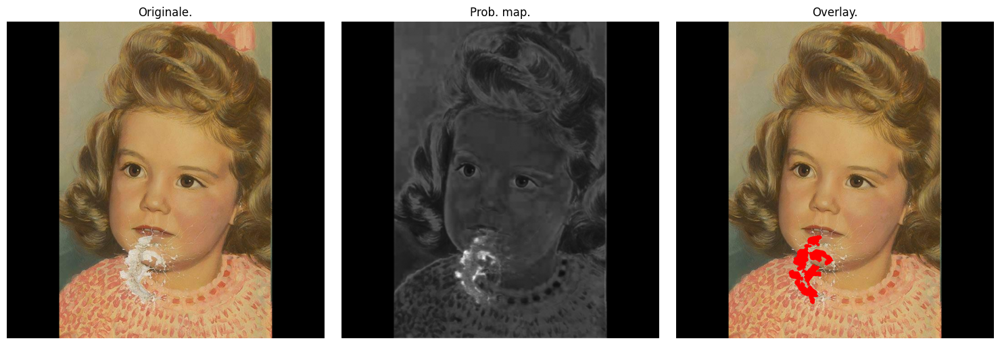

In [ ]:
manage_inference(0.23, img_input_crack_folder + "cracked-painting-restoration-before.png");

max prob:  0.7630462646484375,  mean:  0.09775756299495697.


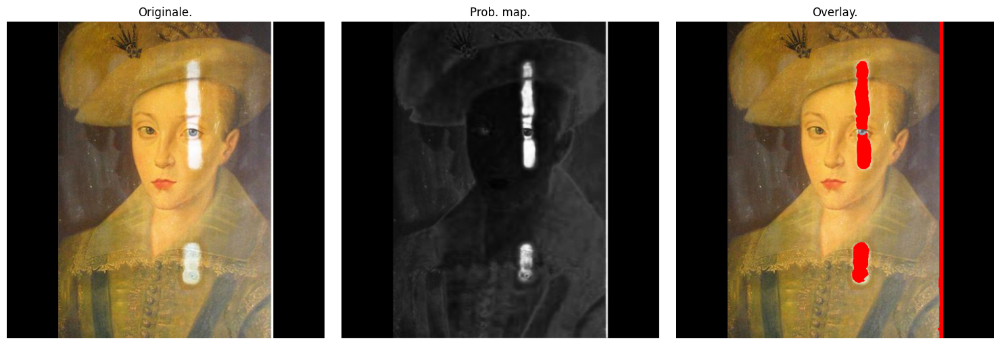

In [ ]:
manage_inference(0.23, img_input_crack_folder + "hat_before.png");

max prob:  0.7570705413818359,  mean:  0.1150689497590065.


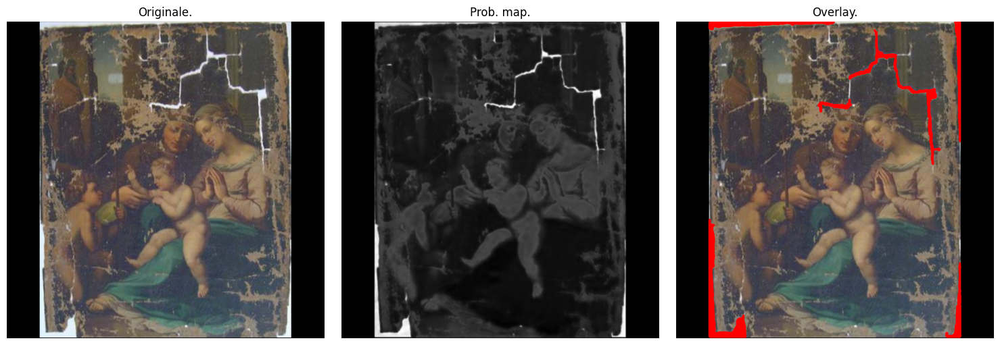

In [ ]:
manage_inference(0.23, img_input_crack_folder + "family-before.jpg");

max prob:  0.7626262307167053,  mean:  0.1260915845632553.


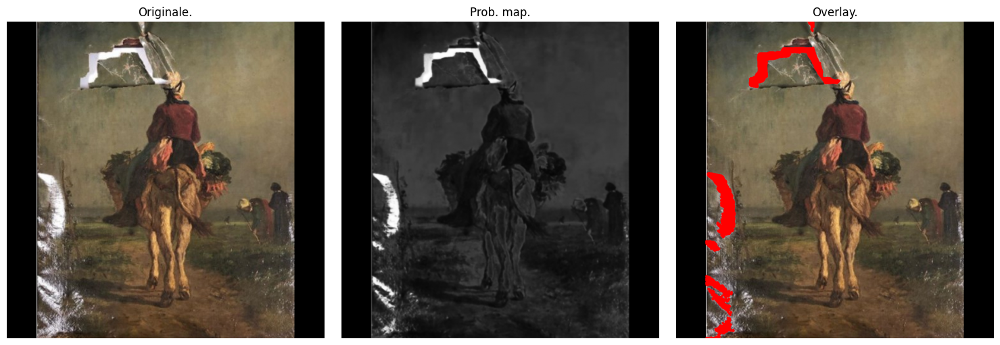

In [ ]:
manage_inference(0.23, img_input_crack_folder + "horse-before.jpg");

**6. Inpainting**

In [ ]:
def inpaint_cracks(img_path,
                   model=model,
                   device=device,
                   thr: float = 0.30,
                   pad_size: int = 1024,
                   inpaint_radius: int = 5,
                   flag=cv2.INPAINT_TELEA):

    # Cricamento e salvataggio dimensioni originali.
    orig = Image.open(img_path).convert('RGB')
    w0, h0 = orig.size

    # Pad (riflessione -> niente bande nere).
    pad_w = max(pad_size - w0, 0)
    pad_h = max(pad_size - h0, 0)
    pad = (pad_w // 2, pad_h // 2, pad_w - pad_w // 2, pad_h - pad_h // 2) # L, T, R, B.

    inp_cv = cv2.cvtColor(np.array(orig), cv2.COLOR_RGB2BGR)
    inp_cv = cv2.copyMakeBorder(inp_cv, pad[1], pad[3], pad[0], pad[2], cv2.BORDER_REFLECT) # Riflessione
    inp = Image.fromarray(cv2.cvtColor(inp_cv, cv2.COLOR_BGR2RGB))

    # Normalizzazione e inferenza.
    x = img_tfms(inp).unsqueeze(0).to(device)
    with torch.no_grad():
        prob = torch.sigmoid(model(x)[0, 0])

    # Maschera.
    mask = clean_mask(prob, thr=thr) # uint8 {0,1}.
    mask[pad[1]:pad[1]+h0, pad[0]:pad[0]+w0] *= 1 # Mantiene solo area reale.
    mask[:pad[1]] = mask[-pad[3]:] = 0 # Banda sopra/sotto.
    mask[:, :pad[0]] = mask[:, -pad[2]:] = 0 # Banda sx/dx.
    mask_cv = (mask * 255).astype(np.uint8)

    # Inpainting.
    inpainted_cv = cv2.inpaint(inp_cv, mask_cv, inpaintRadius=inpaint_radius, flags=flag)

    # Crop al frame originale.
    y1, y2 = pad[1], pad[1] + h0
    x1, x2 = pad[0], pad[0] + w0
    inpainted_rgb = cv2.cvtColor(inpainted_cv[y1:y2, x1:x2], cv2.COLOR_BGR2RGB)

    return inpainted_rgb

In [ ]:
def show_output(thr, thr3, test_img):
  thr = thr;
  # thr2 = thr2;
  thr3 = thr3;

  a = inpaint_cracks(
    test_img,
    thr=thr,
    inpaint_radius=8,
    flag=cv2.INPAINT_TELEA
  )
  '''b = inpaint_cracks(
    test_img,
    thr=thr2,
    inpaint_radius=8,
    flag=cv2.INPAINT_TELEA
  )'''
  c = inpaint_cracks(
    test_img,
    thr=thr3,
    inpaint_radius=8,
    flag=cv2.INPAINT_TELEA
  )

  # Visualizzazione.
  fig, ax = plt.subplots(1, 3, figsize=(15, 5))
  ax[0].imshow(Image.open(test_img).convert('RGB'));
  ax[0].set_title('Originale');
  ax[0].axis('off')
  ax[1].imshow(a);
  ax[1].set_title('Inpainted con la soglia: ' + str(thr));
  ax[1].axis('off')
  # ax[2].imshow(b);
  # ax[2].set_title('Inpainted con la soglia: ' + str(thr2));
  # ax[2].axis('off')
  ax[2].imshow(c);
  ax[2].set_title('Inpainted con la soglia: ' + str(thr3));
  ax[2].axis('off')

  plt.tight_layout(); plt.show()

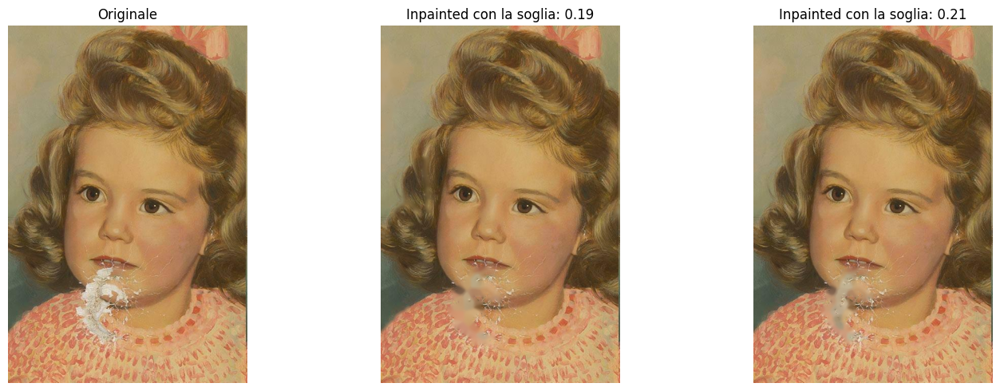

In [ ]:
show_output(0.19, 0.21, img_input_crack_folder + "cracked-painting-restoration-before.png")

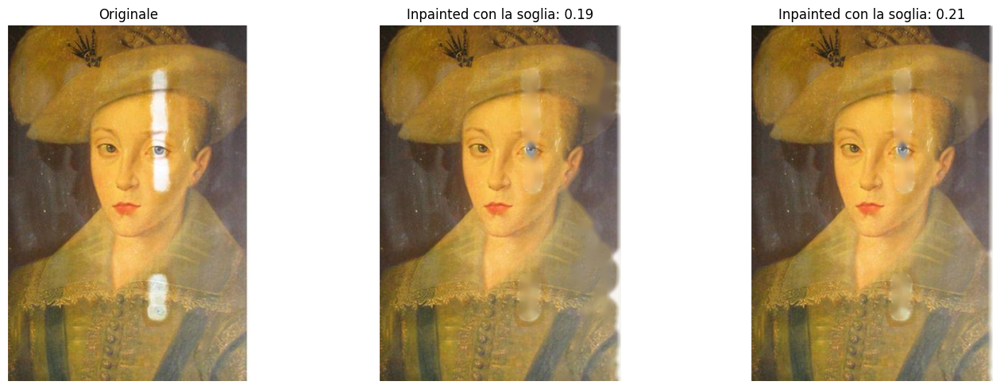

In [ ]:
show_output(0.19, 0.21, img_input_crack_folder + "hat_before.png")

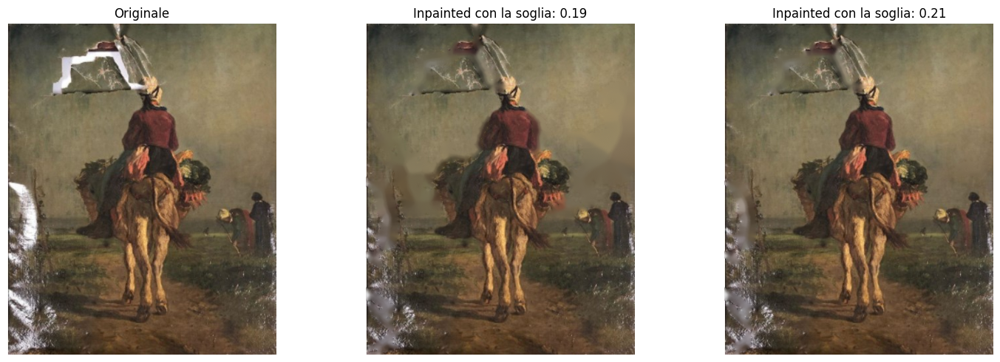

In [ ]:
show_output(0.19, 0.21, img_input_crack_folder + "horse-before.jpg")